In [ ]:
# import libraries

import numpy as np
import pandas as pd
from src.neuron import *
from src.utils import *
from src.constants import * 
from src.network import *
from src.validation import *
from src.viz import *
from src.genetic_algorithm import *
from copy import copy
from datetime import datetime
from IPython.display import display, HTML


In [6]:

"""
Successful Runs:
/Users/stevenwendel/Documents/GitHub/bg/data/J_2025-02-21_01-21-45.pkl
/Users/stevenwendel/Documents/GitHub/bg/data/I_2025-02-14_01-24-49.pkl
/Users/stevenwendel/Documents/GitHub/bg/data/explore_B_2025-02-19_00-41-51.pkl
/Users/stevenwendel/Documents/GitHub/bg/data/J_2025-02-21_11-29-39.pkl
/Users/stevenwendel/Documents/GitHub/bg/data/K_2025-02-23_09-19-11.pkl

"""


file_path = '~~~~~~~~~~~~~~~~~~'

def pickle_to_dataframe(path):
    # Collect data in a list
    ga_raw = pickle.load(open(path, 'rb'))
    data = []
    
    for gen, runs in ga_raw.items():
        for run in runs:
            data.append([gen, run['dna'], run['dna_score']])
            
    # Create DataFrame in one go
    df = pd.DataFrame(data, columns=['generation', 'dna', 'dna_score'])

    # Sort the DataFrame (not the transposed version)
    ga_results = df.sort_values(by='dna_score', ascending=False, ignore_index=True)
    return ga_results

ga_results=pickle_to_dataframe(file_path)
display(ga_results)



FileNotFoundError: [Errno 2] No such file or directory: '~~~~~~~~~~~~~~~~~~'

In [13]:
## Counting unique configurations

import pandas as pd

# Assuming ga_results is your DataFrame
qualifier_depth = 10000
max_synapses = 25

# Function to convert DNA list to a tuple of boolean values indicating non-zero elements
def dna_to_nonzero_config(dna):
    return tuple(1 if weight != 0 else 0 for weight in dna)

# Dictionary to store unique configurations and their details
unique_configs = {}
for index, row in ga_results.head(qualifier_depth).iterrows():
    config = dna_to_nonzero_config(row['dna'])
    # Calculate the number of non-zero entries
    non_zero_count = sum(config)
    # Only consider configurations with non-zero counts of 18 or lower
    if non_zero_count <= max_synapses and config not in unique_configs:
        # Store the index, dna_score, and non-zero count
        unique_configs[config] = {
            'index': index,
            'dna_score': row['dna_score'],
            'non_zero_count': non_zero_count
        }

# Print the unique configurations with their details
for config, details in unique_configs.items():
    print(f"Configuration: {config}, Details: {details}")

Configuration: (1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1), Details: {'index': 0, 'dna_score': 711, 'non_zero_count': 16}
Configuration: (1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1), Details: {'index': 37, 'dna_score': 709, 'non_zero_count': 17}
Configuration: (1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1), Details: {'index': 142, 'dna_score': 707, 'non_zero_count': 14}
Configuration: (1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1), Details: {'index': 147, 'dna_score': 706, 'non_zero_count': 15}
Configuration: (1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 

In [14]:
# Calculate the average weight across TOP 100 DNA
import pandas as pd
import numpy as np

# Assuming ga_results is your DataFrame
# Sort by dna_score to get the top 100 scoring DNA
top_100 = ga_results.nlargest(100, 'dna_score')

# Function to convert DNA list to a tuple of boolean values indicating non-zero elements
def dna_to_nonzero_config(dna):
    return tuple(1 if weight != 0 else 0 for weight in dna)

# Initialize a list to count non-zero occurrences for each position
non_zero_counts = np.zeros(len(top_100.iloc[0]['dna']))

# Initialize a list to sum weights for each position
weight_sums = np.zeros(len(top_100.iloc[0]['dna']))

# Iterate over each DNA list
for index, row in top_100.iterrows():
    dna = row['dna']
    for i, weight in enumerate(dna):
        if weight != 0:
            non_zero_counts[i] += 1
            weight_sums[i] += weight

# Calculate the threshold for 90% presence
threshold = 0.9 * len(top_100)

# Identify positions that are non-zero in 90% or more of the DNA lists
always_on_positions = [i for i, count in enumerate(non_zero_counts) if count >= threshold]

# Calculate average weights for these positions
average_weights = {i: weight_sums[i] / non_zero_counts[i] for i in always_on_positions}

# Assuming ACTIVE_SYNAPSES is a list of tuples like this:
# ACTIVE_SYNAPSES = [('Neuron1', 'Neuron2'), ('Neuron3', 'Neuron4'), ...]

# Map positions to synapses
always_on_synapses = [(ACTIVE_SYNAPSES[i], average_weights[i]) for i in always_on_positions]

# Print the results
print("Synapses that are almost always on (90% or more) in the top 100 scoring DNA:")
for synapse, avg_weight in always_on_synapses:
    print(f"{synapse}: Avg Weight = {avg_weight:.1f}")

Synapses that are almost always on (90% or more) in the top 100 scoring DNA:
['Somat', 'ALMprep']: Avg Weight = 357.0
['Somat', 'MSN1']: Avg Weight = 894.4
['MSN1', 'SNR1']: Avg Weight = -114.7
['MSN1', 'SNR2']: Avg Weight = -382.8
['MSN2', 'SNR2']: Avg Weight = -97.4
['MSN3', 'SNR3']: Avg Weight = -42.9
['VMprep', 'ALMprep']: Avg Weight = 50.9
['VMresp', 'ALMresp']: Avg Weight = 444.8
['ALMprep', 'MSN2']: Avg Weight = 24.8
['ALMresp', 'MSN3']: Avg Weight = 40.2
['ALMprep', 'VMprep']: Avg Weight = 623.0
['ALMresp', 'VMresp']: Avg Weight = 230.7
['ALMinter', 'ALMprep']: Avg Weight = -729.1
['PPN', 'THALgo']: Avg Weight = 30.8
['THALgo', 'ALMinter']: Avg Weight = 350.9
['THALgo', 'ALMresp']: Avg Weight = 924.8


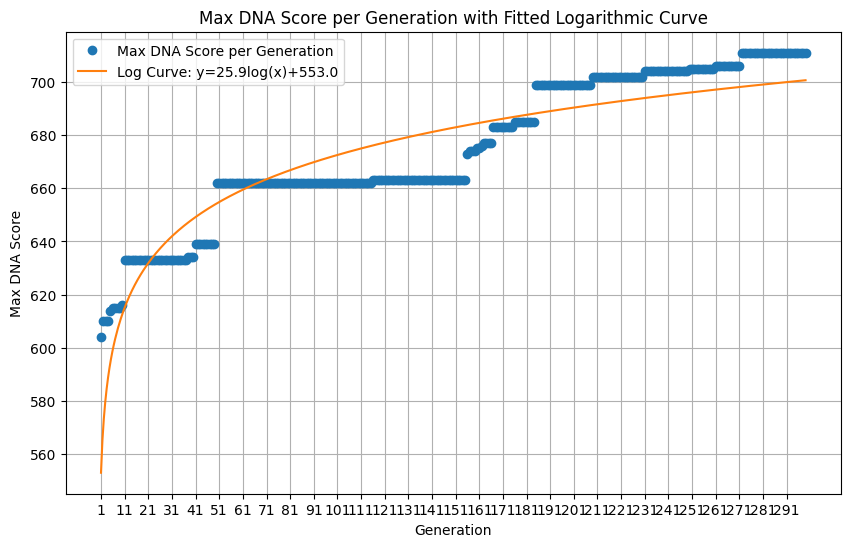

The equation of the fitted curve is: y = 25.90 * log(x) + 552.99


In [15]:
# Max DNA Score per Generation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df=ga_results
df['generation'] = df['generation'].astype(int)

# Group by 'generation' and find the max 'dna_score' for each group
max_scores_per_generation = df.groupby('generation')['dna_score'].max().reset_index()

# Extract the data for fitting
x = max_scores_per_generation['generation'][1:]
y = max_scores_per_generation['dna_score'][1:]

# Define a logarithmic function
def log_func(x, a, b):
    return a * np.log(x) + b

# Fit the logarithmic curve
params, _ = curve_fit(log_func, x, y)
a,b = params

# Generate x values for the fitted curve
x_fit = np.linspace(x.min(), x.max(), 500)
y_fit = log_func(x_fit, *params)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'o', label='Max DNA Score per Generation')  # Original data
plt.plot(x_fit, y_fit, '-', label=f'Log Curve: y={a:.1f}log(x)+{b:.1f}')  # Fitted curve

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Max DNA Score')
plt.title('Max DNA Score per Generation with Fitted Logarithmic Curve')

# Set sparse tick marks
plt.xticks(ticks=x[::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Add legend
plt.legend()

# Display the plot
plt.show()


# Print the equation of the curve
print(f"The equation of the fitted curve is: y = {a:.2f} * log(x) + {b:.2f}")

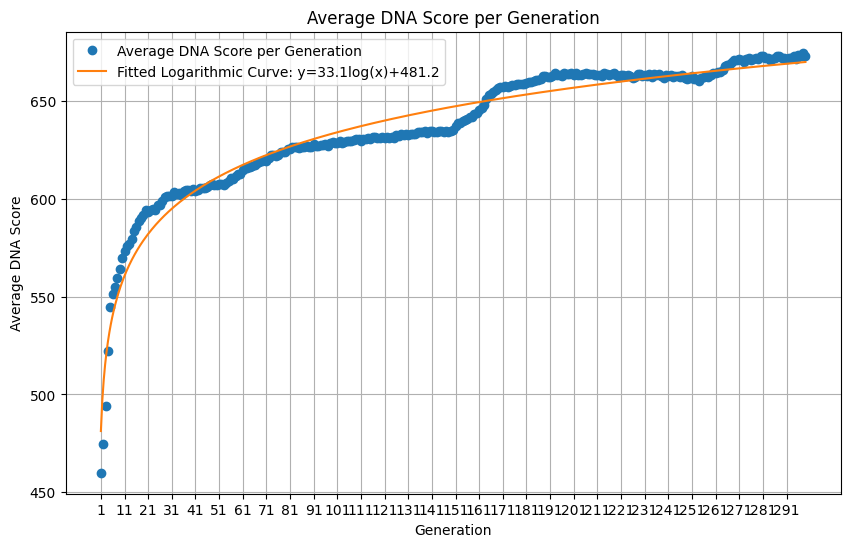

In [9]:
#Average DNA Score per Generation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Group by 'generation' and calculate the average 'dna_score' for each group
average_scores_per_generation = df.groupby('generation')['dna_score'].mean().reset_index()

# Extract the data for fitting
x = average_scores_per_generation['generation'][1:]
y = average_scores_per_generation['dna_score'][1:]

# Define a logarithmic function
def log_func(x, a, b):
    return a * np.log(x) + b

# Fit the logarithmic curve
params, _ = curve_fit(log_func, x, y)

# Extract parameters
a, b = params

# Generate x values for the fitted curve
x_fit = np.linspace(x.min(), x.max(), 500)
y_fit = log_func(x_fit, *params)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'o', label='Average DNA Score per Generation')  # Original data
plt.plot(x_fit, y_fit, '-', label=f'Fitted Logarithmic Curve: y={a:.1f}log(x)+{b:.1f}')  # Fitted curve

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Average DNA Score')
plt.title('Average DNA Score per Generation')

# Set sparse tick marks
plt.xticks(ticks=x[::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Add legend
plt.legend()

# Display the plot
plt.show()

Number of synapses: 49


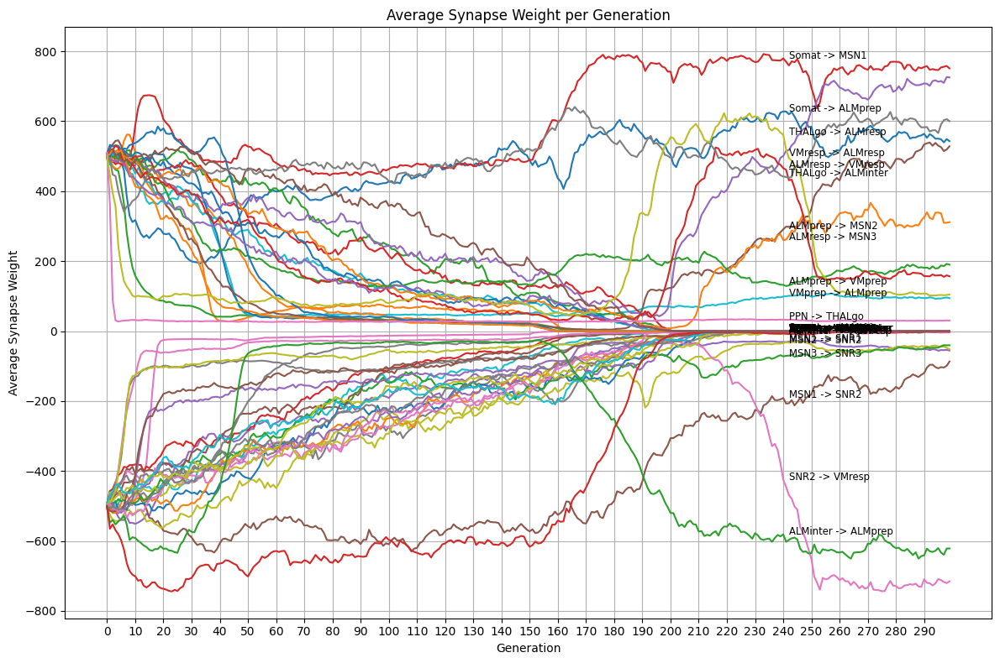

In [9]:
# Evolution of ALL synapse weights over generations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Extract the DNA weights into a separate DataFrame
weights_df = pd.DataFrame(df['dna'].tolist())

# Check the number of synapses
num_synapses = weights_df.shape[1]
print(f"Number of synapses: {num_synapses}")

# Add the generation column to the weights DataFrame
weights_df['generation'] = df['generation']

# Calculate the average weight for each synapse across all generations
average_weights_per_generation = weights_df.groupby('generation').mean().reset_index()

# Assuming ACTIVE_SYNAPSES is a list of tuples like this:
# ACTIVE_SYNAPSES = [('Neuron1', 'Neuron2'), ('Neuron3', 'Neuron4'), ...]

# Create synapse labels from ACTIVE_SYNAPSES
synapse_labels = [f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES]

# Plotting
plt.figure(figsize=(12, 8))

# Plot each synapse's average weight over generations
for i in range(num_synapses):  # Use the actual number of synapses
    plt.plot(average_weights_per_generation['generation'], average_weights_per_generation[i], label=synapse_labels[i])

    # Annotate each line with its label around generation 100
    gen_100_index = average_weights_per_generation['generation'].searchsorted(average_weights_per_generation.shape[0]*.8)
    if gen_100_index < len(average_weights_per_generation):
        plt.annotate(synapse_labels[i],
                     xy=(average_weights_per_generation['generation'][gen_100_index], average_weights_per_generation[i][gen_100_index]),
                     xytext=(5, 0),  # Offset the text slightly
                     textcoords='offset points',
                     fontsize='small',
                     color='black')

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Average Synapse Weight')
plt.title('Average Synapse Weight per Generation')

# Set sparse tick marks
plt.xticks(ticks=average_weights_per_generation['generation'][::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()

In [10]:
# Evolution of EACH synapse weight over generations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Extract the DNA weights into a separate DataFrame
weights_df = pd.DataFrame(df['dna'].tolist())

# Check the number of synapses
num_synapses = weights_df.shape[1]
print(f"Number of synapses: {num_synapses}")

# Add the generation column to the weights DataFrame
weights_df['generation'] = df['generation']

# Calculate the average weight for each synapse across all generations
average_weights_per_generation = weights_df.groupby('generation').mean().reset_index()

# Assuming ACTIVE_SYNAPSES is a list of tuples like this:
# ACTIVE_SYNAPSES = [('Neuron1', 'Neuron2'), ('Neuron3', 'Neuron4'), ...]

# Create synapse labels from ACTIVE_SYNAPSES
synapse_labels = [f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES]


def plot_synapse(synapse_index):
    plt.figure(figsize=(12, 8))
    plt.plot(average_weights_per_generation['generation'], average_weights_per_generation[synapse_index], label=synapse_labels[synapse_index])

    # Annotate each line with its label around generation 100
    gen_100_index = average_weights_per_generation['generation'].searchsorted(average_weights_per_generation.shape[0]*.8)
    if gen_100_index < len(average_weights_per_generation):
        plt.annotate(synapse_labels[synapse_index],
                     xy=(average_weights_per_generation['generation'][gen_100_index], average_weights_per_generation[synapse_index][gen_100_index]),
                     xytext=(5, 0),  # Offset the text slightly
                     textcoords='offset points',
                     fontsize='small',
                     color='black')

    # Adding labels and title
    plt.xlabel('Generation')
    plt.ylabel('Average Synapse Weight')
    plt.title(f'Average Synapse Weight per Generation for {synapse_labels[synapse_index]}')

    # Set y-scale from -1000 to 1000
    plt.ylim(-1000, 1000)

    # Set sparse tick marks
    plt.xticks(ticks=average_weights_per_generation['generation'][::10])  # Adjust the step as needed for sparsity

    # Show grid for better readability
    plt.grid(True)

    # Display the plot
    plt.tight_layout()
    plt.show()

# Create an interactive slider to flip through the synapses
interact(plot_synapse, synapse_index=IntSlider(min=0, max=num_synapses-1, step=1, value=0))

Number of synapses: 49


interactive(children=(IntSlider(value=0, description='synapse_index', max=48), Output()), _dom_classes=('widge…

<function __main__.plot_synapse(synapse_index)>

In [16]:
# Synaptic weights for the best run
best_run = ga_results.iloc[0]

# Create a labeled Series for the best run's DNA
best_run_labeled = pd.Series(best_run['dna'], index=[f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES])
non_zero_count = (best_run_labeled != 0).sum()

display(best_run_labeled)
len(best_run_labeled)
print(non_zero_count)

Somat -> ALMprep        389
Somat -> ALMinter         0
Somat -> ALMresp          0
Somat -> MSN1          1000
MSN1 -> SNR1             -9
MSN1 -> SNR2           -191
MSN1 -> SNR3              0
MSN2 -> SNR1              0
MSN2 -> SNR2            -28
MSN2 -> SNR3              0
MSN3 -> SNR1              0
MSN3 -> SNR2              0
MSN3 -> SNR3             -6
SNR1 -> VMprep            0
SNR1 -> VMresp            0
SNR2 -> VMprep            0
SNR2 -> VMresp            0
SNR3 -> VMprep            0
SNR3 -> VMresp            0
VMprep -> ALMprep        47
VMprep -> ALMinter        0
VMprep -> ALMresp         0
VMresp -> ALMprep         0
VMresp -> ALMinter        0
VMresp -> ALMresp       301
ALMprep -> MSN2          22
ALMinter -> MSN1          0
ALMinter -> MSN2          0
ALMinter -> MSN3          0
ALMresp -> MSN1           0
ALMresp -> MSN2           0
ALMresp -> MSN3          37
ALMprep -> VMprep       519
ALMresp -> VMresp       253
MSN1 -> MSN2              0
MSN1 -> MSN3        

16


In [12]:
# Directed graph of the top 2000 scoring DNA
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import interact, IntSlider

# Filter configurations to only include those with non_zero_count less than 18
filtered_configs = {config: details for config, details in unique_configs.items() if details['non_zero_count'] < 19}

# Function to determine the width of each edge
def get_edge_width(weight):
    return np.ceil(abs(weight) / 200) + 1

# Function to determine the style of each edge
def get_edge_style(weight):
    return 'dashed' if weight < 0 else 'solid'

# Function to plot a specific configuration
def plot_configuration(config_index):
    config, details = list(filtered_configs.items())[config_index]
    print(f"Configuration: {config}, \n Details: {details}")
    
    # Create a labeled Series for the best run's DNA
    best_run_labeled = pd.Series(ga_results.iloc[details['index']]['dna'], index=[f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES])

    # Create a graph
    G = nx.DiGraph()

    # Add nodes for each neuron
    G.add_nodes_from(NEURON_NAMES)

    # Add edges for non-zero synaptic connections
    for synapse, weight in best_run_labeled.items():
        if weight != 0:
            source, target = synapse.split(' -> ')
            G.add_edge(source, target, weight=weight)

    # Define custom positions for each node
    custom_pos = {
        'Somat': (5, 5.5),
        'MSN1': (5, 4),
        'MSN2': (3, 4),
        'MSN3': (0, 4),
        'SNR1': (5, 2),
        'SNR2': (3, 2),
        'SNR3': (0, 2),
        'ALMinter': (2, 5),
        'PPN': (2, 0),
        'THALgo': (2, 2.5),
        'VMprep': (4, 1),
        'ALMprep': (4, 5),
        'ALMresp': (1, 5),
        'VMresp': (1, 1)
    }

    # Draw the main graph using the custom positions
    plt.figure(figsize=(12, 6))
    edges = G.edges(data=True)
    nx.draw(G, pos=custom_pos, with_labels=True, node_size=3000, node_color='lightblue', font_size=10, font_weight='bold', arrowsize=20,
            width=[get_edge_width(data['weight']) for _, _, data in edges],
            style=[get_edge_style(data['weight']) for _, _, data in edges],
            edge_color='black')  # Default edge color

    # Create a slightly offset position for the overlapping arrows
    offset = 0.09  # Adjust this value to control the offset distance
    offset_pos = {node: (x + offset, y + offset) for node, (x, y) in custom_pos.items()}

    # Draw overlapping arrows for specific connections in always_on_synapses
    G_overlap = nx.DiGraph()
    G_overlap.add_edges_from([(source, target) for (source, target), _ in always_on_synapses])

    # Calculate widths based on avg_weight
    overlap_widths = [get_edge_width(avg_weight) for (_, _), avg_weight in always_on_synapses]

    # Draw these edges with a smaller size and red color, including arrowheads
    nx.draw_networkx_edges(G_overlap, pos=offset_pos, edge_color='red', arrows=True, arrowsize=20, width=overlap_widths)

    # Add edge labels
    edge_labels = nx.get_edge_attributes(G, 'weight')
    nx.draw_networkx_edge_labels(G, pos=custom_pos, edge_labels=edge_labels, font_color='gray')

    plt.title('Non-zero Synaptic Connections with Overlapping Arrows')
    plt.show()

# Create an interactive slider to flip through the filtered configurations
interact(plot_configuration, config_index=IntSlider(min=0, max=len(filtered_configs)-1, step=1, value=0))

interactive(children=(IntSlider(value=0, description='config_index', max=50), Output()), _dom_classes=('widget…

<function __main__.plot_configuration(config_index)>

In [17]:
# Matrix, experimental, and control viz

jh_weights= create_dna_string(new_jh_weights, ACTIVE_SYNAPSES)

curr_dna = ga_results.iloc[0]['dna']
# curr_dna = jh_weights
# Load DNA
dna_matrix = load_dna(curr_dna)


# === Preparing Network === 
all_neurons = create_neurons()
splits, input_waves, alpha_array = create_experiment()
criteria_dict = define_criteria()
max_score = TMAX//BIN_SIZE * len(CRITERIA_NAMES)

dna_score, neuron_data = evaluate_dna(
                dna_matrix=dna_matrix,
                neurons=all_neurons,
                alpha_array=alpha_array,
                input_waves=input_waves,
                criteria=criteria_dict,
                curr_dna=curr_dna
                )
total_score = sum(dna_score.values())
print(f'    === DNA: {curr_dna}') 
print(f'    === Control: {dna_score["control"]}/{max_score}')
print(f'    === Experimental: {dna_score["experimental"]}/{max_score}')
print(f'    === Overall: {total_score}({total_score/(2*max_score):.2%})')
print('\n')

# STRUCTURE OF NEURON_DATA
# neuron_data = {
#     'experimental': {
#         'neuron_name': {
#             'hist_V': np.array(),
#             'spike_times': np.array()
#         },
#     'control': {
#         'neuron_name': {
#             'hist_V': np.array(),
#             'spike_times': np.array()
#             }
#         }
#     }
# }


# print(np.sum(neuron_data[ 'experimental']['VMresp']['spike_times'][3500:4000]))

# ====BINNING SPIKES===

# Define the bin size in terms of the number of time steps (assuming each step is 1ms)
bin_size = 1000

# Iterate over each condition and neuron to calculate spikes per bin
for condition in ['experimental', 'control']:
    print(f"Condition: {condition}")
    for neuron_name, data in neuron_data[condition].items():
        spike_times = data['spike_times']
        num_bins = len(spike_times) // bin_size
        spikes_per_bin = [int(np.sum(spike_times[i*bin_size:(i+1)*bin_size])) for i in range(num_bins)]
        
        print(f"Neuron: {neuron_name}, {spikes_per_bin}")

spikelist = neuron_data['experimental']['SNR1']['spike_times']
for i in range(len(spikelist)):
    if spikelist[i] == 1:
        print(i)



diagnostic = {
        'show_dna_matrix' : True,
        'show_neuron_plots' : True,
        'show_difference_histogram' : False,
        'show_dna_scores': False
    }


if diagnostic['show_dna_matrix']:
                print("Currently loaded matrix ---")
                display_matrix(dna_matrix, NEURON_NAMES)

if diagnostic['show_dna_scores']:
                print(f'{dna_score=}: {curr_dna}')
            
if diagnostic['show_neuron_plots']:
                for condition in ['experimental', 'control']:
                    target_neurons_hist_Vs = np.array([neuron_data[condition][name]['hist_V'] for name in NEURON_NAMES])
                    plot_neurons_interactive(hist_Vs=target_neurons_hist_Vs, neuron_names=NEURON_NAMES, sq_wave=input_waves[0], go_wave=input_waves[1], show_u=False)
                    

    === DNA: [389, 0, 0, 1000, -9, -191, 0, 0, -28, 0, 0, 0, -6, 0, 0, 0, 0, 0, 0, 47, 0, 0, 0, 0, 301, 22, 0, 0, 0, 0, 0, 37, 519, 253, 0, 0, 0, 0, 0, 0, 0, 0, -707, 0, 0, 0, 28, 202, 1000]
    === Control: 221/500
    === Experimental: 490/500
    === Overall: 711(71.10%)


Condition: experimental
Neuron: Somat, [0, 24, 0, 0, 0]
Neuron: MSN1, [0, 128, 2, 0, 0]
Neuron: SNR1, [17, 2, 16, 18, 17]
Neuron: VMprep, [0, 772, 1000, 179, 0]
Neuron: ALMprep, [0, 277, 333, 41, 0]
Neuron: MSN2, [0, 24, 36, 5, 0]
Neuron: SNR2, [17, 2, 0, 14, 18]
Neuron: PPN, [13, 13, 13, 24, 14]
Neuron: THALgo, [0, 0, 0, 5, 0]
Neuron: ALMinter, [0, 0, 0, 12, 0]
Neuron: MSN3, [0, 0, 0, 165, 191]
Neuron: SNR3, [17, 18, 18, 3, 0]
Neuron: ALMresp, [0, 0, 0, 861, 1000]
Neuron: VMresp, [0, 0, 0, 841, 1000]
Condition: control
Neuron: Somat, [0, 0, 0, 0, 0]
Neuron: MSN1, [0, 0, 0, 0, 0]
Neuron: SNR1, [17, 18, 18, 17, 18]
Neuron: VMprep, [0, 0, 0, 0, 0]
Neuron: ALMprep, [0, 0, 0, 0, 0]
Neuron: MSN2, [0, 0, 0, 0, 0]
Neuron

,Somat,MSN1,SNR1,VMprep,ALMprep,MSN2,SNR2,PPN,THALgo,ALMinter,MSN3,SNR3,ALMresp,VMresp
Somat,0.0,1000.0,0.0,0.0,389.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MSN1,0.0,0.0,-9.0,0.0,0.0,0.0,-191.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SNR1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
VMprep,0.0,0.0,0.0,0.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ALMprep,0.0,0.0,0.0,519.0,0.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MSN2,0.0,0.0,0.0,0.0,0.0,0.0,-28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SNR2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PPN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0
THALgo,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,202.0,0.0,0.0,1000.0,0.0
ALMinter,0.0,0.0,0.0,0.0,-707.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
